In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import geopandas as gpd


In [4]:

def create_summary_stats():
    df_customer = pd.read_csv("../data/customers.csv")
    gender_counts = df_customer.groupby(["PLZ", "Geschlecht"]).size().unstack(fill_value=0)
    # Altersstatistik pro PLZ
    age_stats = df_customer.groupby("PLZ")["Alter"].agg(['count', 'mean'])
    # Beide Tabellen zusammenführen
    plz_summary = gender_counts.join(age_stats)
    return(plz_summary)


def prepare_customer_plz_map(df_customer):

    df_plz =  pd.read_csv("../data/plz_coords.csv")
    df_plz_unique = df_plz.drop_duplicates(subset="plz")
    gdf = gpd.read_file("berlin_plz_shapefile/plz.shp")
    gdf['plz'] = gdf['plz'].astype(int)


    df = pd.merge(df_customer, df_plz_unique.loc[:,["name", "plz","lat", "lon"]], left_on="PLZ", right_on="plz", how="left")

    gdf_merged = gdf.merge(df, left_on='plz', right_on='plz', how='left')
    gdf_plot = gdf_merged[gdf_merged['count'].notna()]
    gdf_plot['count'] = gdf_plot['count'].astype(float)
    gdf_plot = gdf_plot.to_crs(epsg=4326)
    return(gdf_plot)


def plot_customer_density_map(gdf):
    # Choroplethenkarte mit Mapbox
    fig = px.choropleth_mapbox(
        gdf,
        geojson=gdf.geometry,
        locations=gdf.index,  # eindeutiger Index für jedes Feature
        color="count",               # Anzahl der Besucher
        hover_name="name",
        hover_data=["plz","count","mean"],
        color_continuous_scale="Viridis",
        mapbox_style="carto-positron",
        zoom=9,
        center={"lat":52.52, "lon":13.405},
    )
    
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
    fig.show()
    return(fig)    

/home/siri/Dokumente/Arbeit/UrbanApes/Dashboard/venv/lib/python3.10/site-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_225436/2250333822.py:30: DeprecationWarning: *choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.choropleth_mapbox(


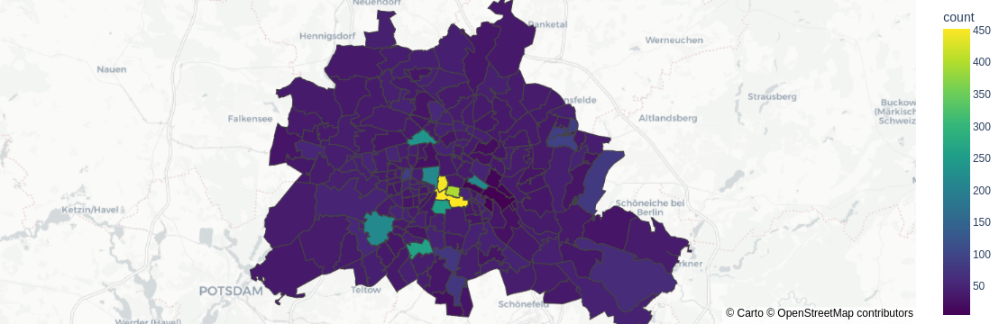

In [5]:
df = create_summary_stats()
gdf = prepare_customer_plz_map(df)
fig = plot_customer_density_map(gdf)

In [12]:
import requests
import zipfile
import io

# URL zum Shapefile (Beispiel: Berlin PLZ)
url = "https://tsb-opendata.s3.eu-central-1.amazonaws.com/plz/plz.shp.zip"

# Datei herunterladen
response = requests.get(url)
response.raise_for_status()

# ZIP entpacken
with zipfile.ZipFile(io.BytesIO(response.content)) as z:
    z.extractall()  # entpackt in das aktuelle Verzeichnis


In [8]:
import pandas as pd
import numpy as np
import random
from datetime import datetime, timedelta
from pathlib import Path


def generate_customers(n=1000, seed=42, plz_path="../data/plz_coords.csv"):
    np.random.seed(seed)
    random.seed(seed)

    # ----------------------------
    # PLZ-Verteilung wie vorher
    all_plz = pd.read_csv(plz_path, dtype=str)
    berlin_plz = all_plz[all_plz["name"].str.contains("Berlin", na=False)].copy()
    berlin_plz_list = berlin_plz["plz"].tolist()

    weights = pd.Series(1.0, index=berlin_plz_list)
    for plz in ["10963", "10961", "10965"]:  # Anhalter
        if plz in weights:
            weights[plz] += 5
    for plz in ["10967", "10969", "10997", "10999", "10783", "10785", "10787", "10789"]:  # Anhalter Umgebung
        if plz in weights:
            weights[plz] += 3
    for plz in ["10117", "10178", "10785", "10997", "13353", "12247", "12101", "14195","10827", "12109"]:  # S25
        if plz in weights:
            weights[plz] += 2
    for plz in ["12059", "10245", "10999", "12435"]:  # Konkurrenz
        if plz in weights:
            weights[plz] *= 0.5
    probs = weights / weights.sum()

    plz = np.random.choice(berlin_plz_list, size=n, p=probs.values)

    # ----------------------------
    # Basisattribute
    geschlechter = np.random.choice(["m", "w", "d"], size=n, p=[0.65, 0.25, 0.10])
    alter = np.random.randint(18, 50, n)  # Kurzversion hier

    # Eintrittsarten (angepasste Verteilung)
    eintrittsarten = np.random.choice(
        ["USC", "Abo", "Tageseintritt"],
        size=n,
        p=[4/7, 1/7, 2/7]
    )

    df_customers = pd.DataFrame({
        "customer_id": range(1, n+1),
        "age": alter,
        "gender": geschlechter,
        "plz": plz,
        "admission": eintrittsarten
    })

    return df_customers



def generate_entries(customers, start="2024-01-01", end="2024-12-31", seed=42):
    np.random.seed(seed)
    random.seed(seed)

    start_date = pd.to_datetime(start)
    end_date = pd.to_datetime(end)
    all_days = pd.date_range(start=start_date, end=end_date, freq="D")

    # Saisonfaktoren pro Monat (Juli/August niedrig, Winter hoch)
    saison_faktor = {
        1: 2.0, 2: 2.0, 3: 1.2, 4: 1.0, 5: 0.8,
        6: 0.6, 7: 0.5, 8: 0.4,
        9: 0.8, 10: 1.5, 11: 1.8, 12: 2.0
    }

    entries = []
    entry_id = 1

    for day in all_days:
        weekday = day.weekday()  # 0=Mo, 6=So
        month = day.month

        # Basisanzahl Eintritte pro Tag
        base = 50 if weekday < 5 else 80  # WE mehr Leute
        count_today = int(base * saison_faktor[month] * np.random.uniform(0.8, 1.2))

        # Uhrzeitverteilungen
        if weekday < 5:  # Wochentage
            hours = np.concatenate([
                np.random.normal(loc=17.5, scale=2, size=int(count_today*0.6)),  # Rushhour
                np.random.normal(loc=12, scale=2, size=int(count_today*0.2)),   # Mittags
                np.random.normal(loc=20, scale=1, size=int(count_today*0.2))    # Abend
            ])
        else:  # Wochenende
            hours = np.concatenate([
                np.random.normal(loc=12, scale=2, size=int(count_today*0.5)),   # Peak Mittag
                np.random.normal(loc=17, scale=2, size=int(count_today*0.3)),   # Nachmittag
                np.random.normal(loc=20, scale=1, size=int(count_today*0.2))    # Abend
            ])

        hours = np.clip(hours, 8 if weekday < 5 else 10, 23 if weekday < 5 else 22)

        for h in hours:
            customer = customers.sample(1).iloc[0]
            time = day + timedelta(hours=float(h))
            entries.append([
                entry_id,
                customer["customer_id"],
                customer["admission"],
                time
            ])
            entry_id += 1

    df_entries = pd.DataFrame(entries, columns=["entry_id", "customer_id", "admission", "time"])
    return df_entries


In [9]:
customer = generate_customers()

In [10]:
customer

,customer_id,age,gender,plz,admission
0,1,45,m,12249,Tageseintritt
1,2,24,m,14193,Tageseintritt
2,3,20,w,13407,Abo
3,4,40,w,10707,Tageseintritt
4,5,45,w,10967,USC
...,...,...,...,...,...
995,996,38,w,13158,USC
996,997,31,d,13469,Tageseintritt
997,998,44,m,10557,Tageseintritt
998,999,35,m,14193,USC


In [11]:
df = generate_entries(customer)

In [12]:
df

,entry_id,customer_id,admission,time
0,1,175,Tageseintritt,2024-01-01 15:16:34.463150
1,2,283,Tageseintritt,2024-01-01 18:08:16.095730
2,3,680,Abo,2024-01-01 18:03:29.097304
3,4,150,USC,2024-01-01 19:31:15.710051
4,5,776,Tageseintritt,2024-01-01 16:20:17.677435
...,...,...,...,...
25347,25348,69,Tageseintritt,2024-12-31 18:01:44.564136
25348,25349,638,Tageseintritt,2024-12-31 20:25:14.855589
25349,25350,174,USC,2024-12-31 18:33:50.286647
25350,25351,640,USC,2024-12-31 20:20:59.847529


In [18]:
class CustomerDataFrame:
    REQUIRED_COLUMNS = ["customer_id", "admission", "age", "gender", "plz"]

    def __init__(self, df: pd.DataFrame):
        # DataFrame kopieren, um Seiteneffekte zu vermeiden
        self.df = df.copy()

        # Prüfen, ob alle benötigten Spalten vorhanden sind
        missing_cols = [col for col in self.REQUIRED_COLUMNS if col not in self.df.columns]
        if missing_cols:
            raise ValueError(f"Fehlende Spalten: {missing_cols}")

        # Optional: Datentypen setzen / konvertieren
        self.df["customer_id"] = self.df["customer_id"].astype(int)
        self.df["admission"] = self.df["admission"].astype("category")
        self.df["age"] = self.df["age"].astype(int)
        self.df["gender"] = self.df["gender"].astype("category")
        self.df["plz"] = self.df["plz"].astype(int)

    @classmethod
    def from_csv(cls, path: str):
        df = pd.read_csv(path)
        return cls(df)

    def __repr__(self):
        # Wenn die Instanz in der Konsole angezeigt wird
        return repr(self.df)

    def __str__(self):
        # Wenn print() aufgerufen wird
        return str(self.df)

In [14]:
class EntryDataFrame:
    REQUIRED_COLUMNS = ["entry_id", "customer_id", "admission", "time"]

    def __init__(self, df: pd.DataFrame):
        # DataFrame kopieren, um Seiteneffekte zu vermeiden
        self.df = df.copy()

        # Prüfen, ob alle benötigten Spalten vorhanden sind
        missing_cols = [col for col in self.REQUIRED_COLUMNS if col not in self.df.columns]
        if missing_cols:
            raise ValueError(f"Fehlende Spalten: {missing_cols}")

        # Optional: Datentypen setzen / konvertieren
        self.df["time"] = pd.to_datetime(self.df["time"])
        self.df["entry_id"] = self.df["entry_id"].astype(int)
        self.df["customer_id"] = self.df["customer_id"].astype(int)
        self.df["admission"] = self.df["admission"].astype("category")

    @classmethod
    def from_csv(cls, path: str):
        df = pd.read_csv(path)
        return cls(df)

    def __repr__(self):
        # Wenn die Instanz in der Konsole angezeigt wird
        return repr(self.df)

    def __str__(self):
        # Wenn print() aufgerufen wird
        return str(self.df)


In [46]:
class AnalyticsService:
    def __init__(self, customers: CustomerDataFrame, entries: EntryDataFrame):
        self.customers = customers.df
        self.entries = entries.df
        # Mergen nach customer_id für Analysen
        self.merged = self.entries.merge(self.customers, on="customer_id", how="left")

    def filter_by_date(self, start=None, end=None):
        df = self.merged
        if start:
            df = df[df["time"] >= pd.to_datetime(start)]
        if end:
            df = df[df["time"] <= pd.to_datetime(end)]
        return df

    def daily_visits(self, start=None, end=None):
        df = self.filter_by_date(start, end)
        return df.groupby(df["time"].dt.date).size()

    def visits_by_category(self, start=None, end=None):
        df = self.filter_by_date(start, end)
        return df.groupby(["admission", df["time"].dt.to_period("M")]).size().unstack(fill_value=0)

    def plz_summary(self, start=None, end=None):
        df = self.filter_by_date(start, end)
        return df.groupby("plz").agg(
            count=("entry_id", "size"),
            mean_age=("age", "mean")
        )

    def plz_geo_summary(self, start=None, end=None, plz_csv="../data/plz_coords.csv", shapefile="../data/berlin_plz_shapefile/plz.shp"):
        """
        Liefert ein GeoDataFrame mit count, mean_age, PLZ-Koordinaten
        für den gewünschten Zeitraum.
        """
        df = self.filter_by_date(start, end)
        # Aggregation: Kunden/Eintritte pro PLZ
        summary = df.groupby("plz").agg(
            count=("entry_id", "size"),
            mean_age=("age", "mean")
        ).reset_index()
    
        # PLZ-Koordinaten und Shapefile joinen
        #df_plz = pd.read_csv(plz_csv)
        gdf = gpd.read_file(shapefile)
        gdf['plz'] = gdf['plz'].astype(int)
    
        gdf_merged = gdf.merge(summary, left_on="plz", right_on="plz", how="left")
        gdf_merged = gdf_merged.to_crs(epsg=4326)
    
        return gdf_merged
    

In [47]:
year_2024 = EntryDataFrame(df)

In [27]:
customers = CustomerDataFrame(customer)

In [48]:
analytics = AnalyticsService(customers, year_2024)

/tmp/ipykernel_225436/282769081.py:7: DeprecationWarning:

*choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



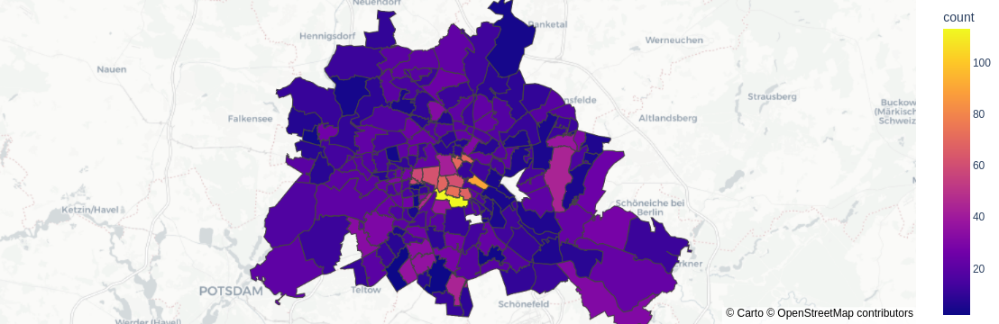

In [52]:
PlotService(analytics).density_plot(start= "01-01-2024", end = "02-02-2024")

In [51]:
class PlotService:
    def __init__(self, analytics: AnalyticsService):
        self.analytics = analytics

    def density_plot(self, start=None, end=None):
        df = self.analytics.plz_geo_summary(start, end)
        fig = px.choropleth_mapbox(
            df,
            geojson=df.geometry,
            locations=df.index,
            color="count",
            hover_name="plz",
            hover_data=["mean_age"],
            mapbox_style="carto-positron",
            zoom=9,
            center={"lat": 52.52, "lon": 13.405},
        )
        fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
        return fig

    def category_trend_plot(self, start=None, end=None):
        df = self.analytics.visits_by_category(start, end)
        fig = px.line(df, labels={"value": "Besuche", "time": "Monat"})
        return fig
